# TOMOseq data analysis pipeline

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore, variation
from sklearn.preprocessing import normalize, scale, MinMaxScaler
#import multiprocessing
from igraph import Graph
import scanpy as sc
import anndata as ad
%matplotlib inline
import scipy



<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


Describe funciton to process de data

In [2]:
def accessData(list_files, list_labels):
    """opens the read/transcript/gene counts of each file"""
    #create empty dictionary to store the dataframes
    dic_dataframes = {}
    #iterate to get the file names
    #make a counter to access the correct label
    count = 0
    for file in list_files:
        #open each file
        data_frame = pd.read_csv(file, sep='\t', index_col=0)
        #add the dataframe as an element of a dictionary with key the filename
        dic_dataframes[list_labels[count]] = data_frame
        count = count + 1
    
    return dic_dataframes

def accessData2(list_files, list_labels):
    """opens the read/transcript/gene counts of each file"""
    #create empty dictionary to store the dataframes
    dic_dataframes = {}
    #iterate to get the file names
    #make a counter to access the correct label
    count = 0
    for file in list_files:
        #open each file
        data_frame = pd.read_csv(file, sep=';', index_col=0)
        #add the dataframe as an element of a dictionary with key the filename
        dic_dataframes[list_labels[count]] = data_frame
        count = count + 1
    
    return dic_dataframes


def accessGzipData(list_files, list_labels):
    """opens the read/transcript/gene counts of each file"""
    #create empty dictionary to store the dataframes
    dic_dataframes = {}
    #iterate to get the file names
    #make a counter to access the correct label
    count = 0
    for file in list_files:
        #open each file
        data_frame = pd.read_csv(file, sep='\t', compression='gzip', index_col=0)
        #add the dataframe as an element of a dictionary with key the filename
        dic_dataframes[list_labels[count]] = data_frame
        count = count + 1
    
    return dic_dataframes



def saveCSV(dic_data, label):
    """Save dataframes inside dictionary to csv files"""
    for key in dic_data:
        dic_data[key].to_csv(key+'_'+label+'.tsv.gz', sep='\t', compression='gzip')
    
    return print('Files saved')


def plotTotalIntensity(data_genes, thr=[4]):
    """plots de total transcript counts per section and the frecuencies. With the variable end we can define a 
    threshold to reduce the number of columns ploted. with thr we set the line for filtering threshold"""
    #create new dictionary to store the total counts
    data_total_log10 = {}
    data_total = {}
    count_threshold = 0

    #subsrtact the keys from the input dictionary
    for key in data_genes:
        name=key.split('_')
        name=' '.join(name)
        #sum all the values in the same column
        data_frame_total = data_genes[key].sum(axis="index")
        #transform to log10, for that we need to add +1 before because log10 of 0 is Na
        modified = data_frame_total+1
        data_frame_total_log10 = pd.DataFrame(np.log10(list(modified)), index=data_frame_total.index.values, columns=['log10'])
        #plot histograms
        sc.set_figure_params(fontsize=7, figsize=(1.5,1.5), color_map='Spectral_r')
        data_frame_total_log10.plot(kind='hist', legend=False, bins=30, color='lightgrey');
        plt.axvline(x=thr[count_threshold], color='black', linestyle='--', lw=1)
        plt.xlabel('Log10 total intensity', fontsize=7, fontname="Microsoft Sans Serif")
        plt.ylabel('Frequency', fontsize=7, fontname="Microsoft Sans Serif")
        plt.xticks(fontsize=7, fontname="Microsoft Sans Serif")
        plt.yticks(fontsize=7, fontname="Microsoft Sans Serif")
        plt.rcParams['svg.fonttype'] = 'none'
        plt.rcParams["font.family"] = "Microsoft Sans Serif"
        plt.savefig(key+'_freq_intesities.svg', format = 'svg', dpi=300, bbox_inches='tight')
        plt.show()

        
        #add 1 to the threshold count
        count_threshold = count_threshold + 1
        
        #save the data in new dictionary of total counts
        data_total_log10[key] = data_frame_total_log10
        data_total[key] = data_frame_total
    
    return data_total_log10, data_total



def plotNfeatures(data_genes, thr):
    """plots de total transcript counts per section and the frecuencies. With the variable end we can define a 
    threshold to reduce the number of columns ploted. with thr we set the line for filtering threshold"""
    #create new dictionary to store the total counts
    data_genes_total = {}
    data_genes_total_log10 = {}
    count_threshold = 0

    #subsrtact the keys from the input dictionary
    for key in data_genes:
        name=key.split('_')
        name=' '.join(name)
        #calculate the number of genes per sections expressed with 2 transcripts or more
        gene_counts = pd.DataFrame(index=data_genes[key].columns.values, columns=['gene_counts'])
        #get the values for each sample
        data_genes[key]=data_genes[key].astype(float)
        for column in data_genes[key].columns:
            #column has the label of the column
            #get the value of each gene for each column and count how many genes are expressed (>1)
            #create a counter for the genes
            count = 0
            for element in data_genes[key][column]:
                if element > 1:
                    count = count + 1
            #save the number of genes of the section in a new dataframe of gene_counts
            gene_counts.at[column, 'gene_counts'] = count
        gene_counts=gene_counts.astype(float)
        #transform to log10, for that we need to add +1 before because log10 of 0 is Na
        gene_counts_modified = gene_counts+1
        
        gene_counts_log10 = pd.DataFrame(np.log10(gene_counts_modified.values.astype(float)), index=gene_counts_modified.index.values, columns=['log10'])
                
        #plot histograms
        sc.set_figure_params(fontsize=7, figsize=(1.5,1.5), color_map='Spectral_r')
        gene_counts.plot(kind='hist', legend=False, bins=30, color='lightgrey');
        plt.axvline(x=thr[count_threshold], color='black', linestyle='--', lw=1)
        plt.xlabel('Detected features', fontsize=7, fontname="Microsoft Sans Serif")
        plt.ylabel('Frequency', fontsize=7, fontname="Microsoft Sans Serif")
        plt.xticks(fontsize=7, fontname="Microsoft Sans Serif")
        plt.yticks(fontsize=7, fontname="Microsoft Sans Serif")
        plt.rcParams['svg.fonttype'] = 'none'
        plt.rcParams["font.family"] = "Microsoft Sans Serif"
        plt.savefig(key+'_freq_features.svg', format = 'svg', dpi=300, bbox_inches='tight')
        plt.show()
        
        
        #add 1 to the threshold count
        count_threshold = count_threshold + 1
        
        #save the data in new dictionary of total counnots
        data_genes_total[key] = gene_counts
        data_genes_total_log10[key] = gene_counts_log10
    
    return data_genes_total_log10, data_genes_total 



def normalizeMedian(dic_data, list_median):
    """Normalize to median
    1. divide by the total reads in each column
    2. multiply by the median of total raeds across sections"""
    #make a counter for the smaple number to select the median position
    count = 0
    #make a dictionary to store the normalized datasets
    dic_normal = {}
    #Get each dataframe
    for key in dic_data:
        #get the total transcript counts per section
        data_frame_total = dic_data[key].sum(axis='index')
        #divide each section by the total of the section
        data_frame_normal_s1 = dic_data[key].divide(data_frame_total, axis='columns')
        #multiply by the meadian value 
        data_frame_normal = data_frame_normal_s1.multiply(list_median[count])
        count = count + 1
        #save the dataframe to the dictionary
        dic_normal[key] = data_frame_normal
    
    return dic_normal


def thresholdEmptySlices(dic_data_total_log10, dic_data, list_thresholds):
    """Filter empty slices form the dataset according to a threshold and rename columns"""
    #create an emtpy dictornary to store the filtered data and a counter 
    data_genes_filtered_s1 = {}
    #create a counter for the samples to substract list_thresholds
    count_threshold = 0
    #get each dataset
    for key in dic_data_total_log10:
        data_frame_total_log10 = dic_data_total_log10[key]
        data_frame_genes = dic_data[key]
        filtered_s1 = pd.DataFrame()
        #make a count to rename the columns (number of columns)
        count_columns = 0
        old_column_label = []
        #access each row of the log10 total transcripts counts
        for column_id in data_frame_total_log10.index.values:
            #check if the value of the column is bigger to the threshold
            if (float(data_frame_total_log10.loc[column_id]) >= list_thresholds[count_threshold]): #float to transform series in float
                filtered_s1[column_id]= data_frame_genes[column_id]
        #add 1 to the threshold count
        count_threshold = count_threshold + 1
        #save the filtered dataframe to the dictionary
        data_genes_filtered_s1[key] = filtered_s1

    
    return data_genes_filtered_s1


def zscores(data):
    """Calculates de z scores for each gene individually"""
    #create a dataframe to store the zscores
    df_zscore = pd.DataFrame(columns = data.columns, index = data.index)
    #calculate z scores for each gene
    #for that we need to get the info from every row independently and then get the z score
    for index in data.index.values:
        #transform the series into list, then to np.array and apply z score funtion from scipy.stats
        #and save it to the Zscore df
        data_gene = np.array(list(data.loc[index]))
        df_zscore.loc[index] = zscore(data_gene.astype(float))

    return df_zscore.astype(float)


def scaledZscores(data):
    """Calculates de scaled z scores for each gene individually.
    Normalize the Z score to scaled Z score (-1 to 1)"""
    #create a dataframe to store the zscores
    df_scaled_zscore = pd.DataFrame(columns = data.columns, index = data.index)
    #calculate z scores for each gene
    #for that we need to get the info from every row independently and then get the z score
    for index in data.index.values:
        ## 1.convert the column value of the dataframe to floats
        float_array = data.loc[index].values.astype(float)
        # Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.
        float_array = float_array.reshape(-1, 1)
        # 2. create a min max processing object
        min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
        scaled_array = min_max_scaler.fit_transform(float_array)
        # 3. convert the scaled array to dataframe. First reshape the array to the original shape
        scaled_array = scaled_array.reshape(len(data.columns.values),)
        df_scaled_zscore.loc[index] = scaled_array

    
    return df_scaled_zscore.astype(float)


## Analisis m/z with scanpy and leiden clusters
### Filtering total intensity and number of features


In [3]:
#access de data
#Create a variable list with the file names and one with the labels to use as dictionary keys
path = 'raw_data/'

file_names = [path + 'PeakMatrix_M1_20um.csv', 
             path + 'PeakMatrix_M2_20um.csv',
             path + 'PeakMatrix_M3_20um.csv']
labels = ['Muscle_1', 'Muscle_2', 'Muscle_3']

#use accessData() function to obtain a dictonary with each dataset with labels as key
data_peak= accessData(file_names, labels)
data_peak['Muscle_1']

,89.056,95.035,97.003,108.941,110.042,110.939,112.934,114.976,117.062,118.094,...,883.639,884.642,885.65,886.654,887.661,888.669,909.651,910.655,911.665,912.672
m/z,,,,,,,,,,,,,,,,,,,,,
Spot 3888,3.13,2.41,12.69,34.95,22.59,18.47,8.95,0.19,14.35,0.09,...,0.57,0.57,0.28,0.00,8.52,0.00,0.28,0.28,0.28,0.00
Spot 3889,0.28,4.84,14.81,21.64,0.43,17.37,0.71,0.71,0.09,0.28,...,0.28,0.28,0.57,0.57,3.42,0.00,0.00,0.28,0.00,0.00
Spot 3890,0.54,1.08,1.08,24.91,1.62,0.72,10.83,0.72,0.72,0.54,...,0.00,1.08,3.25,0.00,0.00,0.00,1.08,0.00,1.08,0.00
Spot 3891,5.65,1.69,35.58,12.43,0.56,14.97,0.42,0.42,0.85,0.42,...,1.69,1.69,0.00,0.00,1.69,0.85,1.69,0.42,0.00,0.00
Spot 3892,2.07,1.80,65.06,34.01,0.02,25.83,2.86,1.15,1.21,0.03,...,1.06,1.04,11.11,3.82,6.56,0.04,1.34,1.17,0.26,0.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Spot 55891,1.97,1.69,11.83,27.61,4.51,10.70,0.85,0.28,0.28,0.56,...,1.13,0.56,0.00,0.56,0.56,0.00,0.00,0.00,0.00,0.56
Spot 55892,0.81,0.40,15.70,5.03,0.60,0.91,0.40,0.30,0.40,0.60,...,0.00,0.60,17.51,8.15,0.00,0.00,0.60,0.60,0.60,0.00
Spot 55893,0.59,0.30,0.30,0.45,0.45,0.59,0.59,0.45,0.45,0.00,...,0.89,1.78,0.00,17.80,0.00,0.89,0.00,1.78,0.89,0.89


In [4]:
#saveCSV(data_peak, 'MSI_ct_unfi')

In [5]:
data_peak_t={}
for key in data_peak:
    data_peak_t[key] = data_peak[key].T # or df1.transpose()
data_peak_t['Muscle_3']

m/z,Spot 103846,Spot 103847,Spot 103848,Spot 103849,Spot 103850,Spot 103851,Spot 103852,Spot 103853,Spot 103854,Spot 103855,...,Spot 141884,Spot 141885,Spot 141886,Spot 141887,Spot 141888,Spot 141889,Spot 141890,Spot 141891,Spot 141892,Spot 141893
89.056,6.67,3.16,0.46,1.38,0.25,5.69,6.54,1.61,1.71,0.18,...,20.77,0.50,0.58,3.78,0.29,0.07,5.20,19.74,0.51,1.72
95.035,6.59,3.30,3.59,10.50,14.33,6.22,0.08,5.50,6.32,5.27,...,15.85,9.41,0.29,8.78,0.58,12.12,24.27,9.56,0.34,7.43
97.003,31.33,20.05,13.27,65.87,28.67,46.27,51.85,13.07,35.50,32.70,...,8.79,0.00,0.86,30.16,0.29,44.81,41.37,54.62,1.01,26.12
108.941,8.09,6.49,15.55,15.42,7.72,33.30,6.87,11.05,15.27,8.09,...,14.58,1.01,0.58,30.67,0.78,18.61,34.13,46.04,0.00,4.29
110.042,2.52,2.64,0.17,6.26,8.09,1.19,2.24,0.06,4.63,0.13,...,4.53,1.34,0.86,0.04,0.29,1.31,1.39,9.73,0.68,0.38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,13.43,10.52,6.32,2.23,0.00,2.04,12.67,6.68,11.89,0.00,...,0.40,18.15,0.00,2.80,2.33,2.52,0.46,0.00,1.01,0.00
909.651,8.63,24.16,3.59,11.17,32.34,15.81,41.00,15.70,29.41,0.79,...,0.40,0.00,0.00,0.00,0.58,19.83,7.40,0.42,3.04,0.00
910.655,14.03,10.60,4.44,6.81,1.47,9.76,0.25,26.46,12.01,0.00,...,0.40,0.00,0.86,0.07,0.58,5.88,1.39,0.10,0.00,0.00
911.665,14.27,15.04,5.30,1.79,6.86,2.18,0.50,7.54,4.51,10.02,...,0.00,1.01,0.00,0.07,0.58,14.80,6.93,0.00,2.03,0.00


In [6]:
labels={}

for index in data_peak_t['Muscle_1'].index:
    labels[index]="{:.3f}".format(float(index)) 

for key in data_peak_t:
    data_peak_t[key]=data_peak_t[key].rename(index=labels)
data_peak_t[key]

m/z,Spot 103846,Spot 103847,Spot 103848,Spot 103849,Spot 103850,Spot 103851,Spot 103852,Spot 103853,Spot 103854,Spot 103855,...,Spot 141884,Spot 141885,Spot 141886,Spot 141887,Spot 141888,Spot 141889,Spot 141890,Spot 141891,Spot 141892,Spot 141893
89.056,6.67,3.16,0.46,1.38,0.25,5.69,6.54,1.61,1.71,0.18,...,20.77,0.50,0.58,3.78,0.29,0.07,5.20,19.74,0.51,1.72
95.035,6.59,3.30,3.59,10.50,14.33,6.22,0.08,5.50,6.32,5.27,...,15.85,9.41,0.29,8.78,0.58,12.12,24.27,9.56,0.34,7.43
97.003,31.33,20.05,13.27,65.87,28.67,46.27,51.85,13.07,35.50,32.70,...,8.79,0.00,0.86,30.16,0.29,44.81,41.37,54.62,1.01,26.12
108.941,8.09,6.49,15.55,15.42,7.72,33.30,6.87,11.05,15.27,8.09,...,14.58,1.01,0.58,30.67,0.78,18.61,34.13,46.04,0.00,4.29
110.042,2.52,2.64,0.17,6.26,8.09,1.19,2.24,0.06,4.63,0.13,...,4.53,1.34,0.86,0.04,0.29,1.31,1.39,9.73,0.68,0.38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,13.43,10.52,6.32,2.23,0.00,2.04,12.67,6.68,11.89,0.00,...,0.40,18.15,0.00,2.80,2.33,2.52,0.46,0.00,1.01,0.00
909.651,8.63,24.16,3.59,11.17,32.34,15.81,41.00,15.70,29.41,0.79,...,0.40,0.00,0.00,0.00,0.58,19.83,7.40,0.42,3.04,0.00
910.655,14.03,10.60,4.44,6.81,1.47,9.76,0.25,26.46,12.01,0.00,...,0.40,0.00,0.86,0.07,0.58,5.88,1.39,0.10,0.00,0.00
911.665,14.27,15.04,5.30,1.79,6.86,2.18,0.50,7.54,4.51,10.02,...,0.00,1.01,0.00,0.07,0.58,14.80,6.93,0.00,2.03,0.00


In [7]:
#access de data
#Create a variable list with the file names and one with the labels to use as dictionary keys
path = 'raw_data/'

file_names = [path + 'Pixel-info_M1_20um_mod.csv', 
             path + 'Pixel-info_M2_20um_mod.csv',
             path + 'Pixel-info_M3_20um_mod.csv']
labels = ['Muscle_1', 'Muscle_2', 'Muscle_3']

#use accessData() function to obtain a dictonary with each dataset with labels as key
data_location= accessData2(file_names, labels)
data_location['Muscle_1']

,x,y
Spot index,,
3887,-161.931168,2609.703613
3888,-141.931168,2629.703613
3889,-141.931168,2609.703613
3890,-141.931168,2589.703613
3891,-121.931175,2669.703613
...,...,...
55890,8938.068359,2309.703613
55891,8938.068359,2289.703613
55892,8958.068359,2389.703613


In [8]:
for key in data_location:
    data_location[key]=data_location[key].set_axis(['Spot ' + str(i+1) for i in list(data_location[key].index)], axis=0)
data_location['Muscle_1']


,x,y
Spot 3888,-161.931168,2609.703613
Spot 3889,-141.931168,2629.703613
Spot 3890,-141.931168,2609.703613
Spot 3891,-141.931168,2589.703613
Spot 3892,-121.931175,2669.703613
...,...,...
Spot 55891,8938.068359,2309.703613
Spot 55892,8938.068359,2289.703613
Spot 55893,8958.068359,2389.703613
Spot 55894,8958.068359,2369.703613


In [9]:
data_location['Muscle_1'].x *=(-1)
data_location['Muscle_1']

,x,y
Spot 3888,161.931168,2609.703613
Spot 3889,141.931168,2629.703613
Spot 3890,141.931168,2609.703613
Spot 3891,141.931168,2589.703613
Spot 3892,121.931175,2669.703613
...,...,...
Spot 55891,-8938.068359,2309.703613
Spot 55892,-8938.068359,2289.703613
Spot 55893,-8958.068359,2389.703613
Spot 55894,-8958.068359,2369.703613


In [10]:
data_location['Muscle_3'].x *=(-1)
data_location['Muscle_3']

,x,y
Spot 103846,-732.241516,9735.958008
Spot 103847,-752.241516,9755.958008
Spot 103848,-752.241516,9735.958008
Spot 103849,-772.241516,9795.958008
Spot 103850,-772.241516,9775.958008
...,...,...
Spot 141889,-7812.241699,10195.958008
Spot 141890,-7812.241699,10175.958008
Spot 141891,-7812.241699,10155.958008
Spot 141892,-7812.241699,10135.958008


In [11]:
data_location['Muscle_2']

,x,y
Spot 55896,1211.864014,6767.472656
Spot 55897,1211.864014,6747.472656
Spot 55898,1211.864014,6727.472656
Spot 55899,1211.864014,6707.472656
Spot 55900,1211.864014,6687.472656
...,...,...
Spot 103841,9391.864258,7487.472656
Spot 103842,9391.864258,7467.472656
Spot 103843,9411.864258,7547.472656
Spot 103844,9411.864258,7527.472656


In [12]:
data_location['Muscle_2'].x *=(-1)
data_location['Muscle_2'].x +=(9431.864258)
data_location['Muscle_2'].x *=(-1)
data_location['Muscle_2']

,x,y
Spot 55896,-8.220000e+03,6767.472656
Spot 55897,-8.220000e+03,6747.472656
Spot 55898,-8.220000e+03,6727.472656
Spot 55899,-8.220000e+03,6707.472656
Spot 55900,-8.220000e+03,6687.472656
...,...,...
Spot 103841,-4.000000e+01,7487.472656
Spot 103842,-4.000000e+01,7467.472656
Spot 103843,-2.000000e+01,7547.472656
Spot 103844,-2.000000e+01,7527.472656


In [13]:
data_location['Muscle_2'].y *=(-1)
data_location['Muscle_2'].y +=(7547.472656+5767.472656)
data_location['Muscle_2']

,x,y
Spot 55896,-8.220000e+03,6547.472656
Spot 55897,-8.220000e+03,6567.472656
Spot 55898,-8.220000e+03,6587.472656
Spot 55899,-8.220000e+03,6607.472656
Spot 55900,-8.220000e+03,6627.472656
...,...,...
Spot 103841,-4.000000e+01,5827.472656
Spot 103842,-4.000000e+01,5847.472656
Spot 103843,-2.000000e+01,5767.472656
Spot 103844,-2.000000e+01,5787.472656


In [14]:
df1 = pd.concat([data_peak_t['Muscle_1'], data_peak_t['Muscle_2']], axis=1)

data_peak_t_all={}
data_peak_t_all['shared'] = pd.concat([df1, data_peak_t['Muscle_3']], axis=1).dropna()

data_peak_t_all['shared']

m/z,Spot 3888,Spot 3889,Spot 3890,Spot 3891,Spot 3892,Spot 3893,Spot 3894,Spot 3895,Spot 3896,Spot 3897,...,Spot 141884,Spot 141885,Spot 141886,Spot 141887,Spot 141888,Spot 141889,Spot 141890,Spot 141891,Spot 141892,Spot 141893
89.056,3.13,0.28,0.54,5.65,2.07,0.28,1.14,7.21,1.95,1.28,...,20.77,0.50,0.58,3.78,0.29,0.07,5.20,19.74,0.51,1.72
95.035,2.41,4.84,1.08,1.69,1.80,1.36,0.38,12.14,5.12,1.32,...,15.85,9.41,0.29,8.78,0.58,12.12,24.27,9.56,0.34,7.43
97.003,12.69,14.81,1.08,35.58,65.06,47.24,0.38,114.81,55.46,44.82,...,8.79,0.00,0.86,30.16,0.29,44.81,41.37,54.62,1.01,26.12
108.941,34.95,21.64,24.91,12.43,34.01,28.96,0.38,37.17,14.49,17.08,...,14.58,1.01,0.58,30.67,0.78,18.61,34.13,46.04,0.00,4.29
110.042,22.59,0.43,1.62,0.56,0.02,2.19,0.57,0.51,0.24,0.88,...,4.53,1.34,0.86,0.04,0.29,1.31,1.39,9.73,0.68,0.38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,0.00,0.00,0.00,0.85,0.04,0.00,0.00,0.76,0.15,1.51,...,0.40,18.15,0.00,2.80,2.33,2.52,0.46,0.00,1.01,0.00
909.651,0.28,0.00,1.08,1.69,1.34,3.35,1.14,0.38,0.15,1.59,...,0.40,0.00,0.00,0.00,0.58,19.83,7.40,0.42,3.04,0.00
910.655,0.28,0.28,0.00,0.42,1.17,2.87,0.00,0.38,0.00,0.11,...,0.40,0.00,0.86,0.07,0.58,5.88,1.39,0.10,0.00,0.00
911.665,0.28,0.00,1.08,0.00,0.26,1.32,0.00,0.38,4.68,0.00,...,0.00,1.01,0.00,0.07,0.58,14.80,6.93,0.00,2.03,0.00


In [15]:
data_peak_t['Muscle_1'].shape, data_peak_t['Muscle_2'].shape, data_peak_t['Muscle_3'].shape, data_peak_t_all['shared'].shape


((251, 52008), (251, 47950), (251, 38048), (251, 138006))

In [16]:
d = {'Pixel': [i.split(' ')[1] for i in data_peak_t['Muscle_1'].columns.values]+[i.split(' ')[1] for i in data_peak_t['Muscle_2'].columns.values]+[i.split(' ')[1] for i in data_peak_t['Muscle_3'].columns.values], 
     'Sample': list(['Muscle_1']*52008+['Muscle_2']*47950+['Muscle_3']*38048), 
     'x': [round(i) for i in list(data_location['Muscle_1']['x'])+list(data_location['Muscle_2']['x'])+list(data_location['Muscle_3']['x'])],
     'y': [round(i) for i in list(data_location['Muscle_1']['y'])+list(data_location['Muscle_2']['y'])+list(data_location['Muscle_3']['y'])],
     'n_features': [sum(data_peak_t['Muscle_1'][column] > 1) for column in data_peak_t['Muscle_1']]+[sum(data_peak_t['Muscle_2'][column] > 1) for column in data_peak_t['Muscle_2']]+[sum(data_peak_t['Muscle_3'][column] > 1) for column in data_peak_t['Muscle_3']],
     'total': list((list(data_peak_t['Muscle_1'].sum())))+list((list(data_peak_t['Muscle_2'].sum())))+list((list(data_peak_t['Muscle_3'].sum()))),
     'total_log10': list(np.log10(list(data_peak_t['Muscle_1'].sum())))+list(np.log10(list(data_peak_t['Muscle_2'].sum())))+list(np.log10(list(data_peak_t['Muscle_3'].sum())))}
df_obs_all = pd.DataFrame(d)
df_obs_all

,Pixel,Sample,x,y,n_features,total,total_log10
0,3888,Muscle_1,162,2610,76,1187.74,3.074721
1,3889,Muscle_1,142,2630,65,831.63,2.919930
2,3890,Muscle_1,142,2610,113,383.67,2.583958
3,3891,Muscle_1,142,2590,50,573.67,2.758662
4,3892,Muscle_1,122,2670,170,1129.27,3.052798
...,...,...,...,...,...,...,...
138001,141889,Muscle_3,-7812,10196,196,3574.92,3.553266
138002,141890,Muscle_3,-7812,10176,128,2206.64,3.343731
138003,141891,Muscle_3,-7812,10156,131,3941.37,3.595647
138004,141892,Muscle_3,-7812,10136,145,262.79,2.419609


In [17]:
d = {'mz': list(data_peak_t_all['shared'].index.values)}
df_var_all = pd.DataFrame(d)
df_var_all



,mz
0,89.056
1,95.035
2,97.003
3,108.941
4,110.042
...,...
246,888.669
247,909.651
248,910.655
249,911.665


In [18]:
adata = ad.AnnData(X=np.array(data_peak_t_all['shared'].T),
                        obs=df_obs_all,
                        var=df_var_all)

adata.var_names = adata.var['mz']
sc.pp.log1p(adata)
adata

/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 138006 × 251
    obs: 'Pixel', 'Sample', 'x', 'y', 'n_features', 'total', 'total_log10'
    var: 'mz'
    uns: 'log1p'

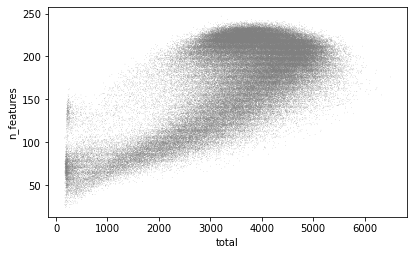

In [19]:
sc.pl.scatter(adata, x='total', y='n_features')

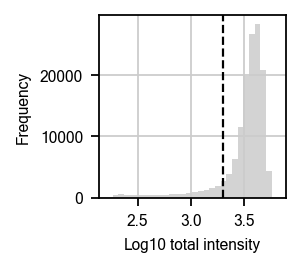

In [20]:
data_total_log10, data_total = plotTotalIntensity(data_peak_t_all, thr=[3.3])


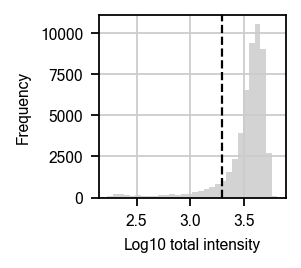

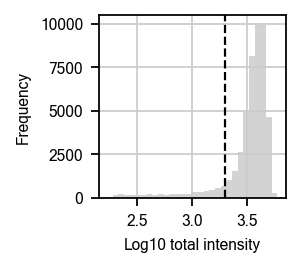

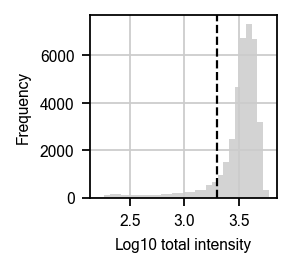

In [21]:
data_total_log10, data_total = plotTotalIntensity(data_peak_t, thr=[3.3,3.3,3.3])

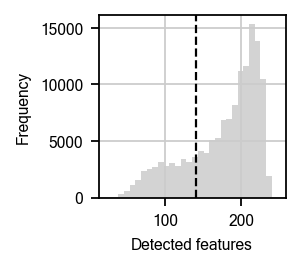

In [22]:
data_nfeatures_log10, data_nfeatures = plotNfeatures(data_peak_t_all, thr=[140])

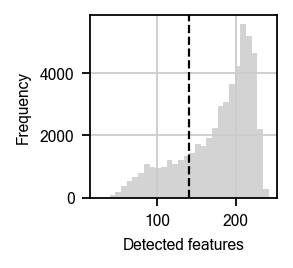

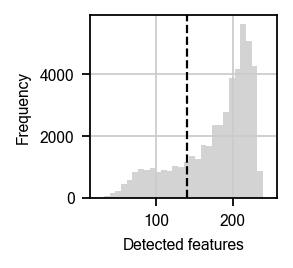

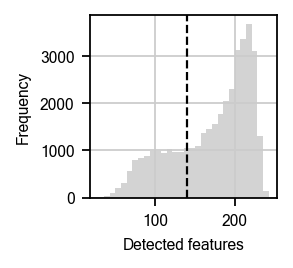

In [23]:
data_nfeatures_log10, data_nfeatures = plotNfeatures(data_peak_t, thr=[140,140,140])

In [25]:
df_obs_all_metadata=df_obs_all
df_obs_all_metadata['itensity_filter']=df_obs_all_metadata.apply(lambda x: 'Included' if x['total_log10'] >= 3.3 else 'Excluded',axis=1)
df_obs_all_metadata['Features_filter']=df_obs_all_metadata.apply(lambda x: 'Included' if x['total_log10'] >= 140 else 'Excluded',axis=1)
#df_obs_all_metadata.to_excel('SourceData_MSI_filtering.xlsx') 
df_obs_all_metadata

,Pixel,Sample,x,y,n_features,total,total_log10,itensity_filter,Features_filter
0,3888,Muscle_1,162,2610,76,1187.74,3.074721,Excluded,Excluded
1,3889,Muscle_1,142,2630,65,831.63,2.919930,Excluded,Excluded
2,3890,Muscle_1,142,2610,113,383.67,2.583958,Excluded,Excluded
3,3891,Muscle_1,142,2590,50,573.67,2.758662,Excluded,Excluded
4,3892,Muscle_1,122,2670,170,1129.27,3.052798,Excluded,Excluded
...,...,...,...,...,...,...,...,...,...
138001,141889,Muscle_3,-7812,10196,196,3574.92,3.553266,Included,Excluded
138002,141890,Muscle_3,-7812,10176,128,2206.64,3.343731,Included,Excluded
138003,141891,Muscle_3,-7812,10156,131,3941.37,3.595647,Included,Excluded
138004,141892,Muscle_3,-7812,10136,145,262.79,2.419609,Excluded,Excluded


In [26]:
##### set threshold to filter out low quality pixels
data_peak_t_filter={}
data_location_filter={}
data_peak_t_excluded={}
data_location_excluded={}
for key in data_peak_t:
    filtered=pd.concat([data_total_log10[key][data_total_log10[key] >= 3.3], data_nfeatures[key][data_nfeatures[key] >= 140]], axis=1).dropna(axis=0)
    excluded=pd.concat([data_total_log10[key][data_total_log10[key] < 3.3], data_nfeatures[key][data_nfeatures[key] < 140]], axis=1).dropna(axis=0)
    data_peak_t_filter[key]=data_peak_t[key][list(filtered.index)]
    data_location_filter[key]=data_location[key].loc[list(filtered.index)]
    data_peak_t_excluded[key]=data_peak_t[key][list(excluded.index)]
    data_location_excluded[key]=data_location[key].loc[list(excluded.index)]
data_peak_t_filter['Muscle_1']

m/z,Spot 3917,Spot 3933,Spot 3940,Spot 3974,Spot 3989,Spot 3992,Spot 4049,Spot 4057,Spot 4110,Spot 4111,...,Spot 55878,Spot 55880,Spot 55881,Spot 55883,Spot 55885,Spot 55886,Spot 55887,Spot 55888,Spot 55889,Spot 55894
89.056,1.31,2.92,0.06,1.90,2.28,1.97,0.46,5.32,2.58,0.70,...,4.32,0.11,2.31,6.39,0.07,1.61,3.61,4.98,8.86,6.67
95.035,3.13,2.92,1.72,1.65,3.65,3.48,0.83,2.79,0.47,2.05,...,0.04,6.50,3.65,3.20,2.10,4.92,6.02,2.74,7.60,5.60
97.003,73.42,37.84,91.12,53.13,112.57,77.04,19.37,37.80,36.58,32.54,...,40.01,8.89,34.34,10.09,11.82,45.55,72.49,56.17,23.00,78.41
108.941,29.72,32.52,33.06,31.26,18.14,37.94,9.63,29.90,5.93,22.31,...,14.09,6.43,13.12,7.06,5.07,15.50,31.09,15.94,5.77,32.51
110.042,2.73,2.68,1.11,0.10,0.26,1.88,1.88,0.24,0.06,2.39,...,5.82,5.77,7.37,2.75,1.69,4.23,12.27,3.94,0.15,4.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,0.06,0.00,0.26,0.19,5.67,0.09,6.88,0.00,1.99,2.23,...,10.91,6.12,7.99,0.34,5.40,10.85,6.96,3.07,4.86,2.16
909.651,4.69,0.00,0.06,0.06,1.95,0.00,0.13,0.09,3.32,0.83,...,11.99,8.65,7.52,12.95,15.67,12.70,11.91,0.00,20.36,1.64
910.655,0.13,0.06,0.00,0.00,2.06,0.17,3.08,0.19,0.09,0.00,...,10.31,1.32,5.56,7.74,6.00,4.53,5.75,0.25,13.52,6.01
911.665,0.00,1.90,0.19,0.63,0.06,0.09,3.80,0.09,0.73,1.31,...,8.03,6.43,0.81,17.83,11.62,9.48,3.88,9.46,18.08,4.31


In [27]:
data_location_filter['Muscle_1']

,x,y
Spot 3917,81.931175,2549.703613
Spot 3933,41.931175,2729.703613
Spot 3940,41.931175,2589.703613
Spot 3974,1.931174,2529.703613
Spot 3989,-18.068827,2569.703613
...,...,...
Spot 55886,-8938.068359,2409.703613
Spot 55887,-8938.068359,2389.703613
Spot 55888,-8938.068359,2369.703613
Spot 55889,-8938.068359,2349.703613


In [28]:
df1 = pd.concat([data_peak_t_excluded['Muscle_1'], data_peak_t_excluded['Muscle_2']], axis=1)

data_peak_t_excluded_all={}
data_peak_t_excluded_all['shared'] = pd.concat([df1, data_peak_t_excluded['Muscle_3']], axis=1).dropna()

data_peak_t_excluded_all['shared']

m/z,Spot 3888,Spot 3889,Spot 3890,Spot 3891,Spot 3894,Spot 3895,Spot 3896,Spot 3900,Spot 3902,Spot 3903,...,Spot 141842,Spot 141844,Spot 141853,Spot 141859,Spot 141865,Spot 141867,Spot 141884,Spot 141886,Spot 141888,Spot 141893
89.056,3.13,0.28,0.54,5.65,1.14,7.21,1.95,3.25,11.00,8.78,...,19.03,0.13,6.62,0.49,13.95,1.01,20.77,0.58,0.29,1.72
95.035,2.41,4.84,1.08,1.69,0.38,12.14,5.12,0.27,10.29,0.41,...,14.27,4.55,1.03,0.73,7.89,0.51,15.85,0.29,0.58,7.43
97.003,12.69,14.81,1.08,35.58,0.38,114.81,55.46,35.31,29.00,12.87,...,10.60,6.15,1.03,40.54,0.91,0.34,8.79,0.86,0.29,26.12
108.941,34.95,21.64,24.91,12.43,0.38,37.17,14.49,12.58,25.54,14.84,...,0.65,12.70,0.68,0.00,0.40,0.51,14.58,0.58,0.78,4.29
110.042,22.59,0.43,1.62,0.56,0.57,0.51,0.24,0.20,0.27,0.20,...,0.32,0.27,1.14,0.00,0.61,0.34,4.53,0.86,0.29,0.38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,0.00,0.00,0.00,0.85,0.00,0.76,0.15,0.00,0.00,0.82,...,1.30,0.53,0.68,0.73,0.00,0.00,0.40,0.00,2.33,0.00
909.651,0.28,0.00,1.08,1.69,1.14,0.38,0.15,0.00,0.53,0.41,...,0.65,9.89,0.00,0.00,0.61,0.00,0.40,0.00,0.58,0.00
910.655,0.28,0.28,0.00,0.42,0.00,0.38,0.00,0.00,0.00,1.63,...,1.30,20.05,2.05,20.45,0.61,0.00,0.40,0.86,0.58,0.00
911.665,0.28,0.00,1.08,0.00,0.00,0.38,4.68,0.00,0.53,1.63,...,0.00,11.50,0.68,0.00,0.61,0.00,0.00,0.00,0.58,0.00


In [29]:
data_peak_t_excluded['Muscle_1'].shape, data_peak_t_excluded['Muscle_2'].shape, data_peak_t_excluded['Muscle_3'].shape, data_peak_t_excluded_all['shared'].shape


((251, 4563), (251, 4644), (251, 4088), (251, 13295))

In [30]:
d = {'Pixel': [i.split(' ')[1] for i in data_peak_t_excluded['Muscle_1'].columns.values]+[i.split(' ')[1] for i in data_peak_t_excluded['Muscle_2'].columns.values]+[i.split(' ')[1] for i in data_peak_t_excluded['Muscle_3'].columns.values], 
     'Sample': list(['Muscle_1']*4563+['Muscle_2']*4644+['Muscle_3']*4088), 
     'x': list(data_location_excluded['Muscle_1']['x'])+list(data_location_excluded['Muscle_2']['x'])+list(data_location_excluded['Muscle_3']['x']),
     'y': list(data_location_excluded['Muscle_1']['y'])+list(data_location_excluded['Muscle_2']['y'])+list(data_location_excluded['Muscle_3']['y']),
     'n_features': [sum(data_peak_t_excluded['Muscle_1'][column] > 1) for column in data_peak_t_excluded['Muscle_1']]+[sum(data_peak_t_excluded['Muscle_2'][column] > 1) for column in data_peak_t_excluded['Muscle_2']]+[sum(data_peak_t_excluded['Muscle_3'][column] > 1) for column in data_peak_t_excluded['Muscle_3']],
     'total': list((list(data_peak_t_excluded['Muscle_1'].sum())))+list((list(data_peak_t_excluded['Muscle_2'].sum())))+list((list(data_peak_t_excluded['Muscle_3'].sum()))),
     'total_log10': list(np.log10(list(data_peak_t_excluded['Muscle_1'].sum())))+list(np.log10(list(data_peak_t_excluded['Muscle_2'].sum())))+list(np.log10(list(data_peak_t_excluded['Muscle_3'].sum())))}
df_obs_all = pd.DataFrame(d)
df_obs_all

,Pixel,Sample,x,y,n_features,total,total_log10
0,3888,Muscle_1,161.931168,2609.703613,76,1187.74,3.074721
1,3889,Muscle_1,141.931168,2629.703613,65,831.63,2.919930
2,3890,Muscle_1,141.931168,2609.703613,113,383.67,2.583958
3,3891,Muscle_1,141.931168,2589.703613,50,573.67,2.758662
4,3894,Muscle_1,121.931175,2629.703613,103,223.55,2.349375
...,...,...,...,...,...,...,...
13290,141867,Muscle_3,-7772.241699,10115.958008,123,355.23,2.550510
13291,141884,Muscle_3,-7792.241699,10175.958008,73,1281.38,3.107678
13292,141886,Muscle_3,-7792.241699,10135.958008,65,394.91,2.596498
13293,141888,Muscle_3,-7792.241699,10095.958008,81,258.70,2.412796


In [31]:
d = {'mz': list(data_peak_t_excluded_all['shared'].index.values)}
df_var_all = pd.DataFrame(d)
df_var_all

,mz
0,89.056
1,95.035
2,97.003
3,108.941
4,110.042
...,...
246,888.669
247,909.651
248,910.655
249,911.665


In [32]:
adata1 = ad.AnnData(X=np.array(data_peak_t_excluded_all['shared'].T),
                        obs=df_obs_all,
                        var=df_var_all)

adata1.var_names = adata1.var['mz']

adata1

/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 13295 × 251
    obs: 'Pixel', 'Sample', 'x', 'y', 'n_features', 'total', 'total_log10'
    var: 'mz'

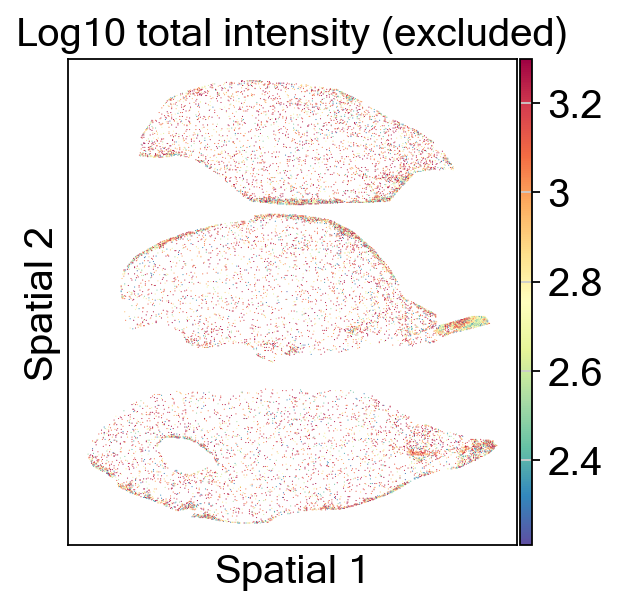

In [33]:
sc.set_figure_params(fontsize=18, color_map='Spectral_r')
ax = sc.pl.scatter(adata1, x='x', y='y', color='total_log10', alpha=1, show=False, size=1)
plt.gcf()
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('Spatial 1',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_ylabel('Spatial 2',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_title('Log10 total intensity (excluded)', fontsize=18, fontname="Microsoft Sans Serif")
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Microsoft Sans Serif"
plt.savefig('scatter_total_excluded.svg', format = 'svg', dpi=300, bbox_inches='tight')  
plt.show()
plt.close()

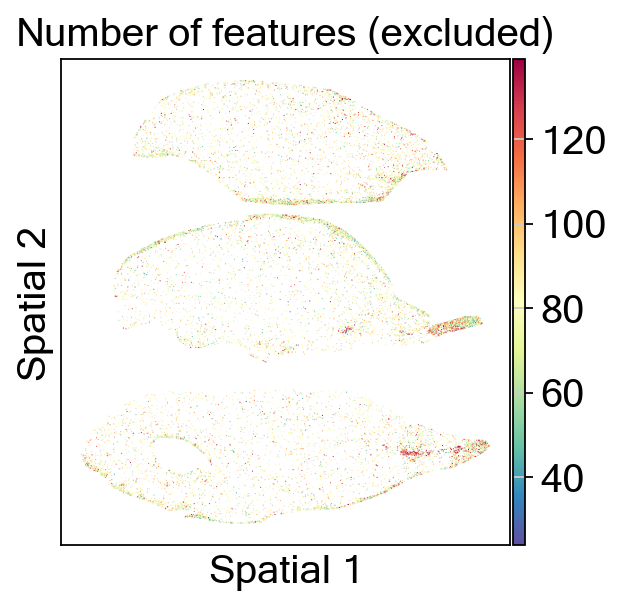

In [34]:
sc.set_figure_params(fontsize=18, color_map='Spectral_r')
ax = sc.pl.scatter(adata1, x='x', y='y', color='n_features', alpha=1, show=False, size=1)
plt.gcf()
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('Spatial 1',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_ylabel('Spatial 2',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_title('Number of features (excluded)', fontsize=18, fontname="Microsoft Sans Serif")
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Microsoft Sans Serif"
plt.savefig('scatter_features_excluded.svg', format = 'svg', dpi=300, bbox_inches='tight')  
plt.show()
plt.close()

#activate this cell to code to print all the fetaures
for m in list(data_peak_t_all['shared'].index.values):
    ax = sc.pl.scatter(adata, x='x', y='y', color=m, alpha=1, show=False, use_raw=False)
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set(xlabel='Spatial 1', ylabel='Spatial 2')
    #plt.savefig('figures/scatter_c4_'+m+'.pdf', dpi=300)
    plt.show()
    plt.close()

In [35]:
#Artifacts selected manually
artifacs=['132.077', '133.060', '207.044','210.090','269.052','296.094']


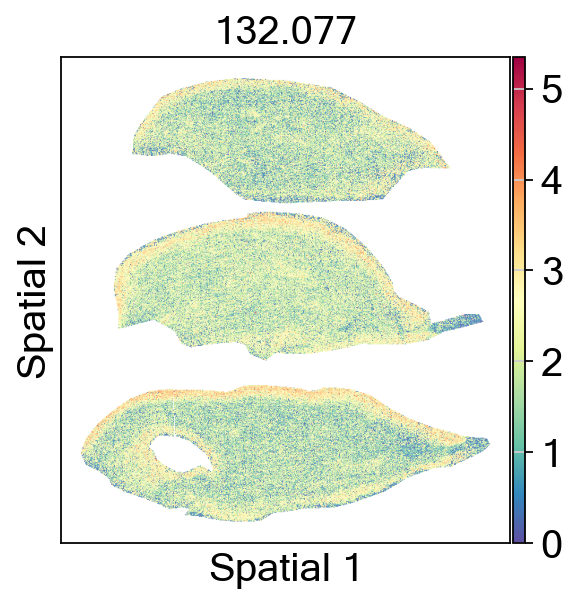

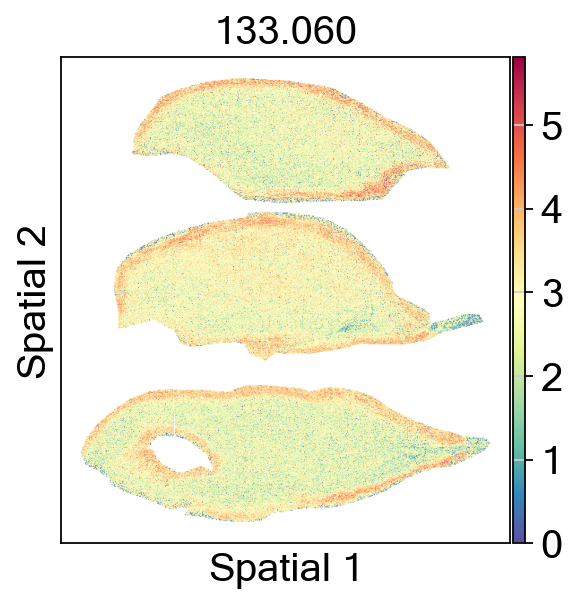

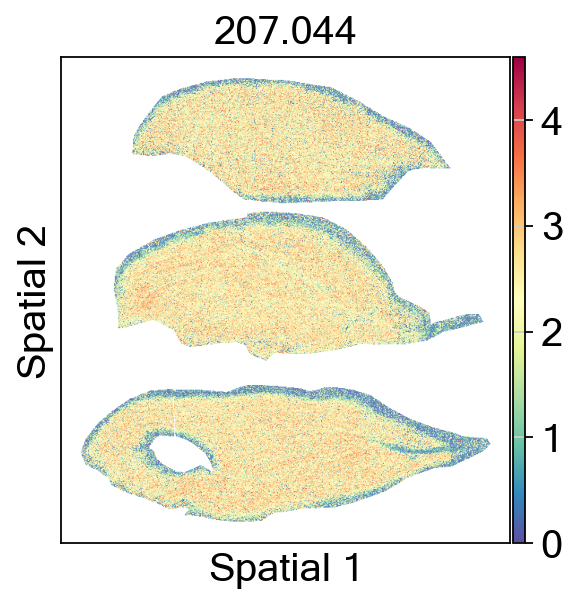

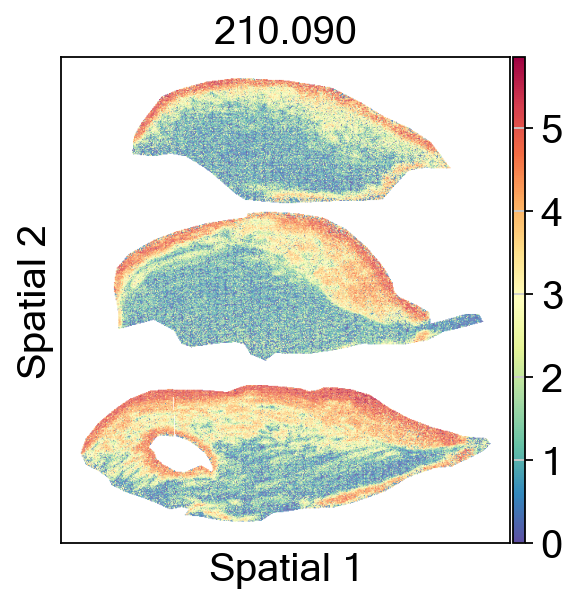

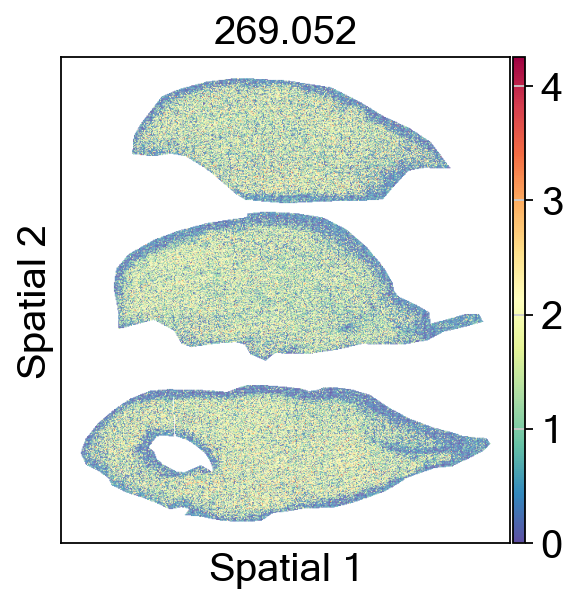

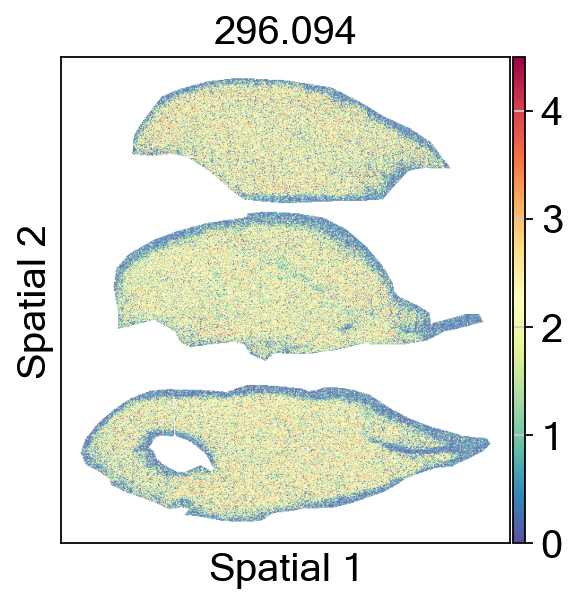

In [36]:
for m in artifacs:
    sc.set_figure_params(fontsize=18, color_map='Spectral_r')
    ax = sc.pl.scatter(adata, x='x', y='y', color=m, alpha=1, show=False)
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Spatial 1',fontsize=18, fontname="Microsoft Sans Serif")
    ax.set_ylabel('Spatial 2',fontsize=18, fontname="Microsoft Sans Serif")
    ax.set_title(m, fontsize=18, fontname="Microsoft Sans Serif")
    plt.rcParams['svg.fonttype'] = 'none'
    plt.rcParams["font.family"] = "Microsoft Sans Serif"
    plt.savefig(m+'_artifact_scatter.svg', format = 'svg', dpi=300, bbox_inches='tight')  
    plt.show()
    plt.close()



In [37]:
for key in data_peak_t:
    data_peak_t[key].loc[artifacs].T.to_excel(key+'_artifacts.xlsx') 

### Normalization to mean intensity

In [38]:
#delet manually selected artificats prior to normalization
#Remove artifacts selected manually
artifacs=['132.077', '133.060', '207.044','210.090','269.052','296.094']
data_peak_t_filter_2={}
data_peak_t_filter_2['Muscle_1']=data_peak_t_filter['Muscle_1'].drop(artifacs)
data_peak_t_filter_2['Muscle_2']=data_peak_t_filter['Muscle_2'].drop(artifacs)
data_peak_t_filter_2['Muscle_3']=data_peak_t_filter['Muscle_3'].drop(artifacs)
data_peak_t_filter_2['Muscle_3']

m/z,Spot 103846,Spot 103847,Spot 103848,Spot 103849,Spot 103851,Spot 103853,Spot 103854,Spot 103856,Spot 103858,Spot 103859,...,Spot 141871,Spot 141872,Spot 141873,Spot 141876,Spot 141877,Spot 141879,Spot 141881,Spot 141883,Spot 141887,Spot 141889
89.056,6.67,3.16,0.46,1.38,5.69,1.61,1.71,2.70,5.59,6.95,...,0.07,6.51,4.20,2.88,1.14,6.61,0.44,3.50,3.78,0.07
95.035,6.59,3.30,3.59,10.50,6.22,5.50,6.32,3.57,13.44,4.00,...,1.72,2.34,2.60,1.68,1.08,6.98,6.56,12.01,8.78,12.12
97.003,31.33,20.05,13.27,65.87,46.27,13.07,35.50,8.28,47.08,44.96,...,30.26,122.36,88.42,102.89,40.40,41.73,39.08,5.15,30.16,44.81
108.941,8.09,6.49,15.55,15.42,33.30,11.05,15.27,15.17,23.55,0.63,...,37.72,34.64,18.66,29.60,5.33,17.40,10.66,24.22,30.67,18.61
110.042,2.52,2.64,0.17,6.26,1.19,0.06,4.63,0.09,3.28,8.50,...,0.05,4.87,1.69,1.72,1.21,0.00,0.27,0.05,0.04,1.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,13.43,10.52,6.32,2.23,2.04,6.68,11.89,12.22,6.24,0.63,...,0.83,2.13,5.11,6.17,27.56,0.00,2.79,3.86,2.80,2.52
909.651,8.63,24.16,3.59,11.17,15.81,15.70,29.41,48.89,27.76,0.42,...,2.48,0.18,4.36,7.35,47.20,9.51,17.87,7.04,0.00,19.83
910.655,14.03,10.60,4.44,6.81,9.76,26.46,12.01,23.08,4.91,0.21,...,2.48,3.23,0.98,3.49,20.77,9.24,5.25,10.90,0.07,5.88
911.665,14.27,15.04,5.30,1.79,2.18,7.54,4.51,18.99,16.46,22.55,...,10.62,3.47,5.02,0.93,23.26,6.93,6.23,1.24,0.07,14.80


In [39]:
df1 = pd.concat([data_peak_t_filter_2['Muscle_1'], data_peak_t_filter_2['Muscle_2']], axis=1)

data_peak_t_filter_all={}
data_peak_t_filter_all['shared'] = pd.concat([df1, data_peak_t_filter_2['Muscle_3']], axis=1).dropna()

data_peak_t_filter_all['shared']

m/z,Spot 3917,Spot 3933,Spot 3940,Spot 3974,Spot 3989,Spot 3992,Spot 4049,Spot 4057,Spot 4110,Spot 4111,...,Spot 141871,Spot 141872,Spot 141873,Spot 141876,Spot 141877,Spot 141879,Spot 141881,Spot 141883,Spot 141887,Spot 141889
89.056,1.31,2.92,0.06,1.90,2.28,1.97,0.46,5.32,2.58,0.70,...,0.07,6.51,4.20,2.88,1.14,6.61,0.44,3.50,3.78,0.07
95.035,3.13,2.92,1.72,1.65,3.65,3.48,0.83,2.79,0.47,2.05,...,1.72,2.34,2.60,1.68,1.08,6.98,6.56,12.01,8.78,12.12
97.003,73.42,37.84,91.12,53.13,112.57,77.04,19.37,37.80,36.58,32.54,...,30.26,122.36,88.42,102.89,40.40,41.73,39.08,5.15,30.16,44.81
108.941,29.72,32.52,33.06,31.26,18.14,37.94,9.63,29.90,5.93,22.31,...,37.72,34.64,18.66,29.60,5.33,17.40,10.66,24.22,30.67,18.61
110.042,2.73,2.68,1.11,0.10,0.26,1.88,1.88,0.24,0.06,2.39,...,0.05,4.87,1.69,1.72,1.21,0.00,0.27,0.05,0.04,1.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,0.06,0.00,0.26,0.19,5.67,0.09,6.88,0.00,1.99,2.23,...,0.83,2.13,5.11,6.17,27.56,0.00,2.79,3.86,2.80,2.52
909.651,4.69,0.00,0.06,0.06,1.95,0.00,0.13,0.09,3.32,0.83,...,2.48,0.18,4.36,7.35,47.20,9.51,17.87,7.04,0.00,19.83
910.655,0.13,0.06,0.00,0.00,2.06,0.17,3.08,0.19,0.09,0.00,...,2.48,3.23,0.98,3.49,20.77,9.24,5.25,10.90,0.07,5.88
911.665,0.00,1.90,0.19,0.63,0.06,0.09,3.80,0.09,0.73,1.31,...,10.62,3.47,5.02,0.93,23.26,6.93,6.23,1.24,0.07,14.80


In [40]:
data_peak_t_filter_2['Muscle_1'].shape, data_peak_t_filter_2['Muscle_2'].shape, data_peak_t_filter_2['Muscle_3'].shape, data_peak_t_filter_all['shared'].shape


((245, 40206), (245, 37419), (245, 27745), (245, 105370))

In [41]:
d = {'Pixel': [i.split(' ')[1] for i in data_peak_t_filter_2['Muscle_1'].columns.values]+[i.split(' ')[1] for i in data_peak_t_filter_2['Muscle_2'].columns.values]+[i.split(' ')[1] for i in data_peak_t_filter_2['Muscle_3'].columns.values], 
     'Sample': list(['Muscle_1']*40206+['Muscle_2']*37419+['Muscle_3']*27745),
     'x': [round(i) for i in list(data_location_filter['Muscle_1']['x'])+list(data_location_filter['Muscle_2']['x'])+list(data_location_filter['Muscle_3']['x'])],
     'y': [round(i) for i in list(data_location_filter['Muscle_1']['y'])+list(data_location_filter['Muscle_2']['y'])+list(data_location_filter['Muscle_3']['y'])],
     'n_features': [sum(data_peak_t_filter_2['Muscle_1'][column] > 1) for column in data_peak_t_filter_2['Muscle_1']]+[sum(data_peak_t_filter_2['Muscle_2'][column] > 1) for column in data_peak_t_filter_2['Muscle_2']]+[sum(data_peak_t_filter_2['Muscle_3'][column] > 1) for column in data_peak_t_filter_2['Muscle_3']],
     'total': list((list(data_peak_t_filter_2['Muscle_1'].sum())))+list((list(data_peak_t_filter_2['Muscle_2'].sum())))+list((list(data_peak_t_filter_2['Muscle_3'].sum()))),
     'total_log10': list(np.log10(list(data_peak_t_filter_2['Muscle_1'].sum())))+list(np.log10(list(data_peak_t_filter_2['Muscle_2'].sum())))+list(np.log10(list(data_peak_t_filter_2['Muscle_3'].sum())))}
df_obs_all = pd.DataFrame(d)
df_obs_all.to_excel('Metadata_MSI.xlsx') 
df_obs_all

,Pixel,Sample,x,y,n_features,total,total_log10
0,3917,Muscle_1,82,2550,155,2207.13,3.343828
1,3933,Muscle_1,42,2730,149,2014.83,3.304238
2,3940,Muscle_1,42,2590,139,2116.17,3.325551
3,3974,Muscle_1,2,2530,157,2614.74,3.417429
4,3989,Muscle_1,-18,2570,165,2222.78,3.346896
...,...,...,...,...,...,...,...
105365,141879,Muscle_3,-7792,10276,177,3741.99,3.573103
105366,141881,Muscle_3,-7792,10236,162,4539.72,3.657029
105367,141883,Muscle_3,-7792,10196,158,3275.87,3.515327
105368,141887,Muscle_3,-7792,10116,165,3261.75,3.513451


In [42]:
#normalize to mean intensity value
mean_norm=[int(df_obs_all['total'].mean())]             
data_peak_t_filter_all_norm = normalizeMedian(data_peak_t_filter_all, mean_norm)            
data_peak_t_filter_all_norm['shared'].sum()

m/z
Spot 3917      3891.0
Spot 3933      3891.0
Spot 3940      3891.0
Spot 3974      3891.0
Spot 3989      3891.0
                ...  
Spot 141879    3891.0
Spot 141881    3891.0
Spot 141883    3891.0
Spot 141887    3891.0
Spot 141889    3891.0
Length: 105370, dtype: float64

In [43]:
data_peak_t_filter_all_norm['shared'][list(data_peak_t_filter_2['Muscle_1'].columns)]

m/z,Spot 3917,Spot 3933,Spot 3940,Spot 3974,Spot 3989,Spot 3992,Spot 4049,Spot 4057,Spot 4110,Spot 4111,...,Spot 55878,Spot 55880,Spot 55881,Spot 55883,Spot 55885,Spot 55886,Spot 55887,Spot 55888,Spot 55889,Spot 55894
89.056,2.309429,5.639046,0.110322,2.827394,3.991164,3.481966,0.721218,9.106840,2.860866,1.321703,...,4.200190,0.115161,2.008292,6.885372,0.064962,1.247677,3.041015,4.983586,9.469910,5.957832
95.035,5.517949,5.639046,3.162563,2.455368,6.389364,6.150884,1.301327,4.775955,0.521166,3.870702,...,0.038891,6.804992,3.173275,3.448073,1.948869,3.812776,5.071167,2.741973,8.123173,5.002078
97.003,129.433799,73.075862,167.542267,79.062863,197.054981,136.167855,30.369530,64.706493,40.562206,61.440320,...,38.900375,9.307135,29.854865,10.872206,10.969347,35.299177,61.064596,56.210450,24.583288,70.038018
108.941,52.394068,62.801983,60.787394,46.518071,31.754263,67.058780,15.098532,51.183178,6.575557,42.124571,...,13.699232,6.731707,11.406401,7.607312,4.705126,12.011795,26.189796,15.951479,6.167199,29.038847
110.042,4.812779,5.175563,2.040956,0.148810,0.455133,3.322892,2.947585,0.410835,0.066532,4.512673,...,5.658590,6.040739,6.407407,2.963188,1.568375,3.278057,10.336082,3.942837,0.160326,4.216037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888.669,0.105775,0.000000,0.478062,0.282739,9.925395,0.159075,10.786906,0.000000,2.206637,4.210569,...,10.607425,6.407161,6.946429,0.366358,5.011377,8.408256,5.863010,3.072211,5.194556,1.929373
909.651,8.268108,0.000000,0.110322,0.089286,3.413496,0.000000,0.203822,0.154063,3.681425,1.567162,...,11.657473,9.055873,6.537815,13.953922,14.542273,9.841922,10.032823,0.000000,21.761554,1.464894
910.655,0.229180,0.115871,0.000000,0.000000,3.606052,0.300474,4.829022,0.325244,0.099798,0.000000,...,10.024066,1.381937,4.833810,8.340028,5.568196,3.510544,4.843722,0.250180,14.450698,5.368301
911.665,0.000000,3.669243,0.349353,0.937504,0.105031,0.159075,5.957884,0.154063,0.809470,2.473473,...,7.807298,6.731707,0.704206,19.212234,10.783740,7.346569,3.268460,9.466812,19.324602,3.849813


In [45]:
#data_peak_t_filter_all_norm['shared'][list(data_peak_t_filter_2['Muscle_1'].columns)].T.to_csv('Muscle_1_MSI_ct_normalized.tsv.gz', sep='\t', compression='gzip')
#data_peak_t_filter_all_norm['shared'][list(data_peak_t_filter_2['Muscle_2'].columns)].T.to_csv('Muscle_2_MSI_ct_normalized.tsv.gz', sep='\t', compression='gzip')
#data_peak_t_filter_all_norm['shared'][list(data_peak_t_filter_2['Muscle_3'].columns)].T.to_csv('Muscle_3_MSI_ct_normalized.tsv.gz', sep='\t', compression='gzip') 


In [46]:
d = {'mz': list(data_peak_t_filter_all['shared'].index.values)}
df_var_all = pd.DataFrame(d)
df_var_all

,mz
0,89.056
1,95.035
2,97.003
3,108.941
4,110.042
...,...
240,888.669
241,909.651
242,910.655
243,911.665


In [47]:
adata = ad.AnnData(X=np.array(data_peak_t_filter_all_norm['shared'].T),
                        obs=df_obs_all,
                        var=df_var_all)

adata.var_names = adata.var['mz']

adata

/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 105370 × 245
    obs: 'Pixel', 'Sample', 'x', 'y', 'n_features', 'total', 'total_log10'
    var: 'mz'

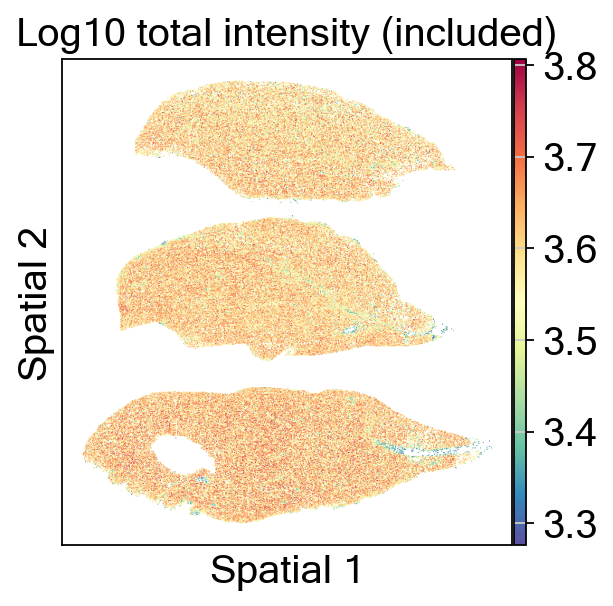

In [48]:
sc.set_figure_params(fontsize=18, color_map='Spectral_r')
ax = sc.pl.scatter(adata, x='x', y='y', color='total_log10', alpha=1, show=False, size=1)
plt.gcf()
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('Spatial 1',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_ylabel('Spatial 2',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_title('Log10 total intensity (included)', fontsize=18, fontname="Microsoft Sans Serif")
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Microsoft Sans Serif"
plt.savefig('scatter_total_included.svg', format = 'svg', dpi=300, bbox_inches='tight')  
plt.show()
plt.close()

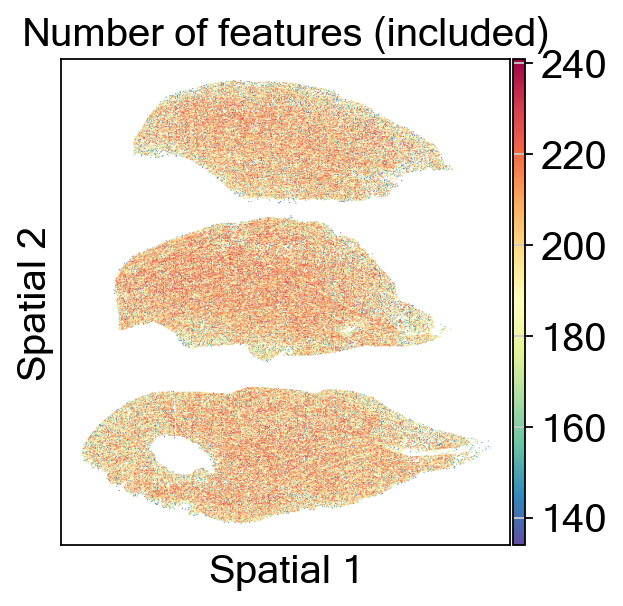

In [49]:
sc.set_figure_params(fontsize=18, color_map='Spectral_r')
ax = sc.pl.scatter(adata, x='x', y='y', color='n_features', alpha=1, show=False, size=1)
plt.gcf()
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('Spatial 1',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_ylabel('Spatial 2',fontsize=18, fontname="Microsoft Sans Serif")
ax.set_title('Number of features (included)', fontsize=18, fontname="Microsoft Sans Serif")
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Microsoft Sans Serif"
plt.savefig('scatter_features_included.svg', format = 'svg', dpi=300, bbox_inches='tight')  
plt.show()
plt.close()

In [50]:
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.scale(adata)
adata

AnnData object with n_obs × n_vars = 105370 × 245
    obs: 'Pixel', 'Sample', 'x', 'y', 'n_features', 'total', 'total_log10'
    var: 'mz', 'mean', 'std'
    uns: 'log1p'

In [51]:
#print the selected m/z
selected_m={'132.995':'Malate', '426.098': 'ADP', '346.124': 'AMP','615.257': 'Heme', '650.238': 'Hemin Heme', '215.096': 'Glucose', '259.087':'Glucose-1-phosphate Glucose-6-phosphate', 
            '339.061':'Fructose-1,6-phosphate', '185.043': '3-Phosphoglycerate', '145.110':'Glutamine 2-Oxoglutarate', '117.062':'Succinate',
           '333.025':'NAD+', '146.099':'Glutamate', '225.161': 'Carnosine', '275.163': 'Anserine', '306.147': 'Glutathione', '175.079':'Ascorbic acid', 
            '790.641':'PE 40:6', '837.645': 'PI 34:0', '838.644':'PE 44:10'}

In [52]:
len(selected_m)

20

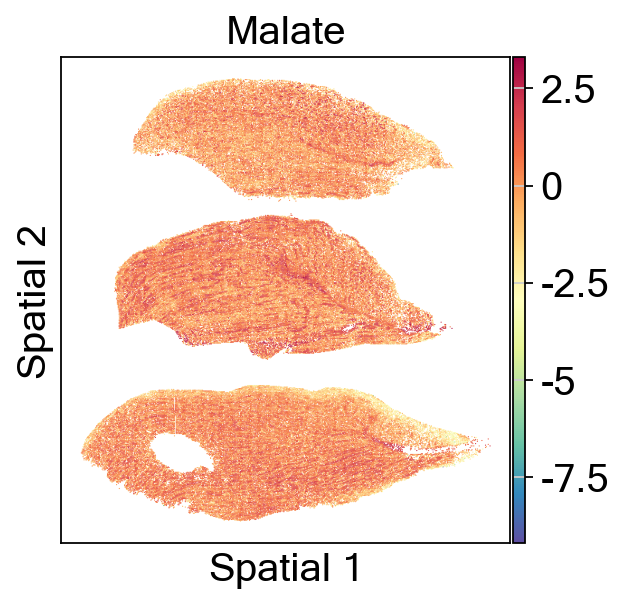

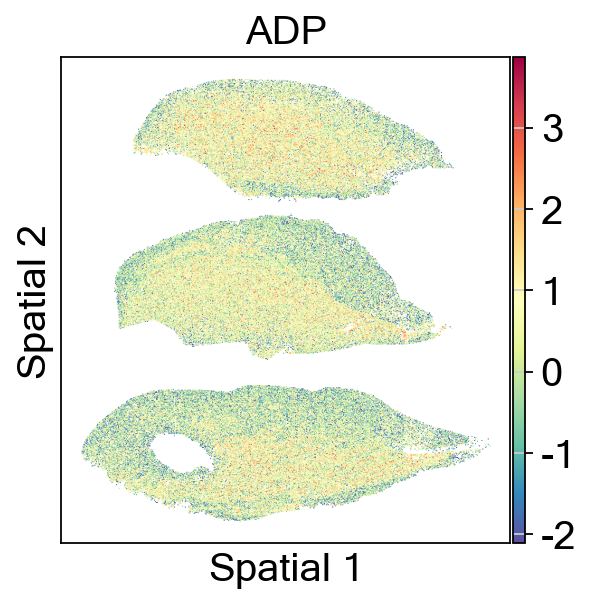

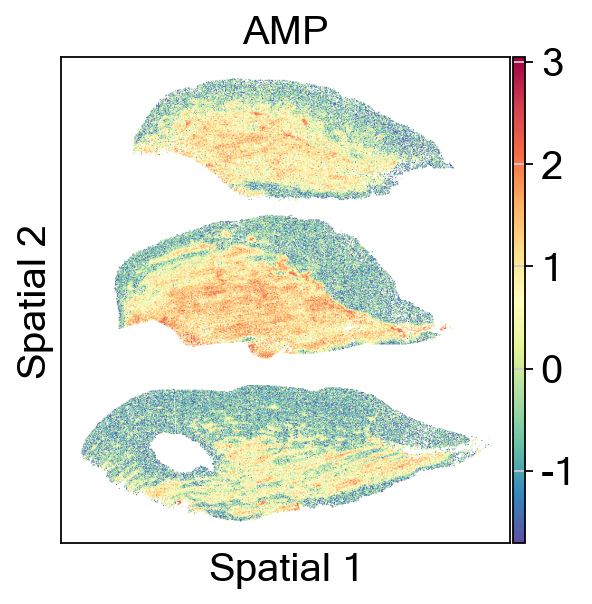

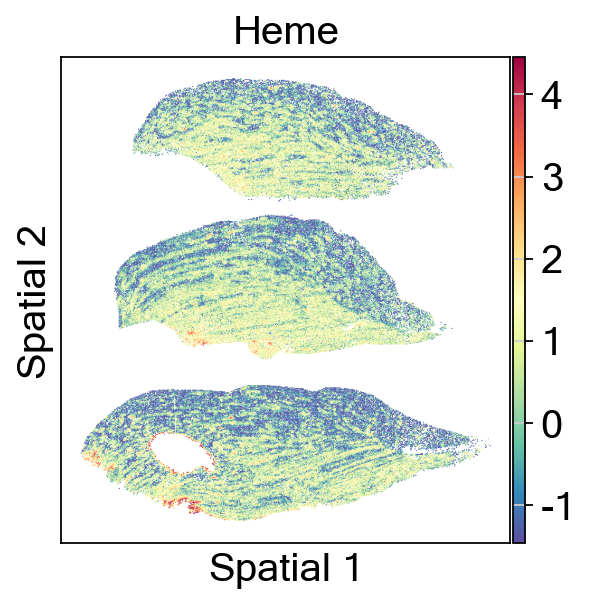

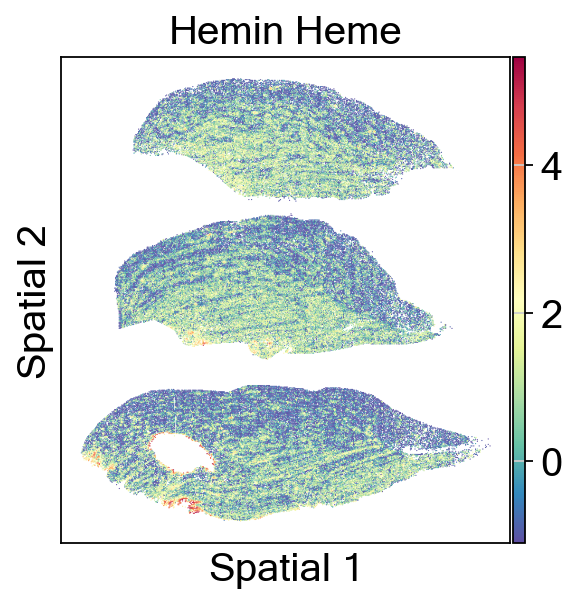

...

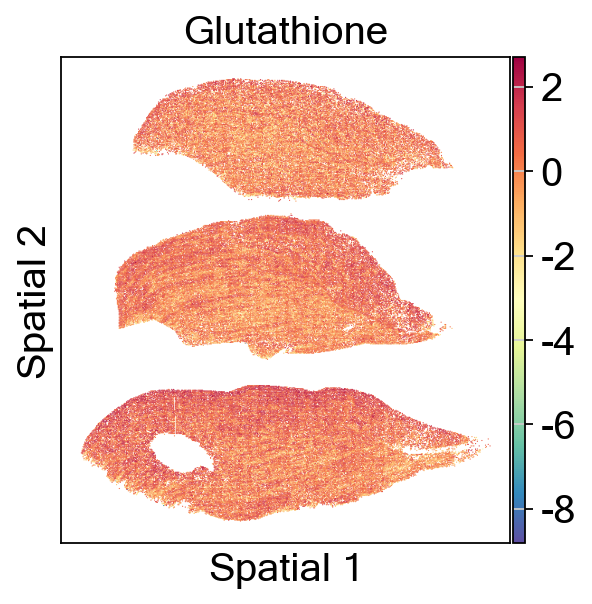

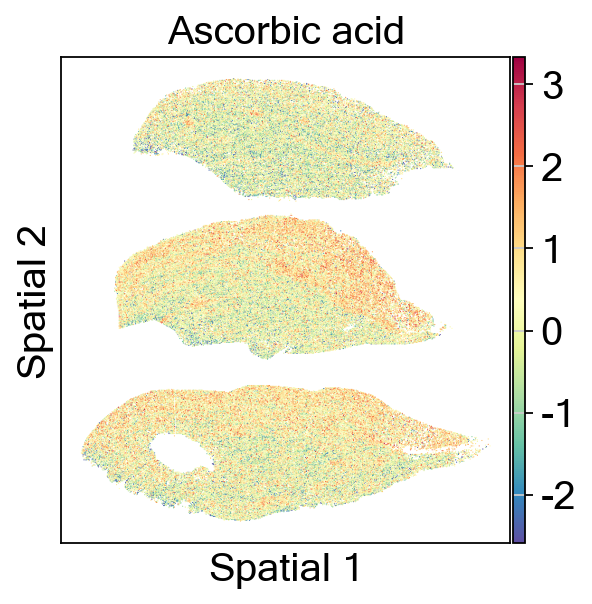

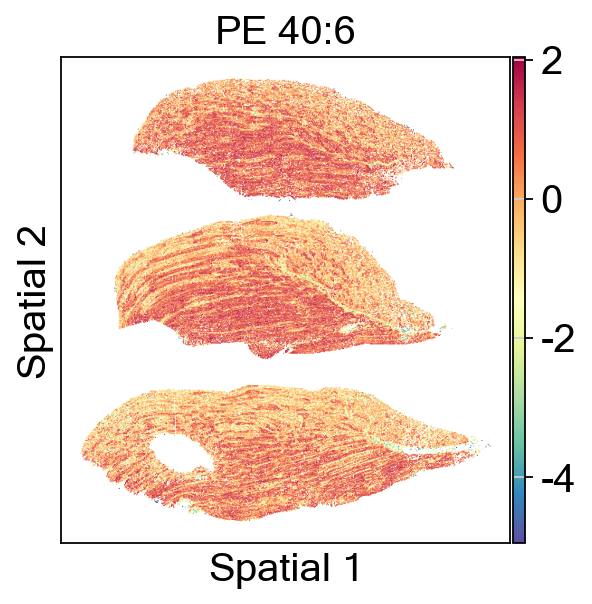

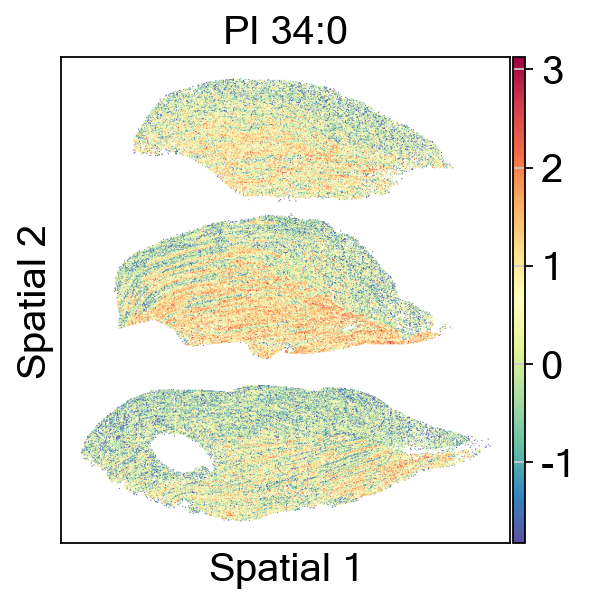

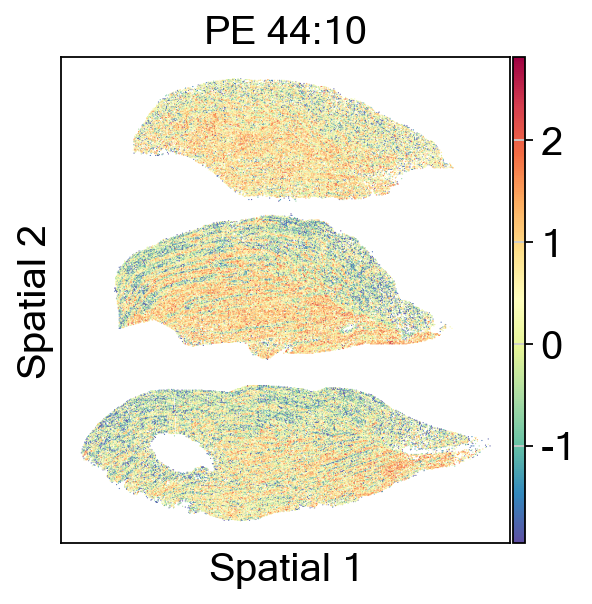

In [53]:

for m in selected_m:
    sc.set_figure_params(fontsize=18, color_map='Spectral_r')
    ax = sc.pl.scatter(adata, x='x', y='y', color=m, alpha=1, show=False)
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Spatial 1',fontsize=18, fontname="Microsoft Sans Serif")
    ax.set_ylabel('Spatial 2',fontsize=18, fontname="Microsoft Sans Serif")
    ax.set_title(selected_m[m], fontsize=18, fontname="Microsoft Sans Serif")
    plt.rcParams['svg.fonttype'] = 'none'
    plt.rcParams["font.family"] = "Microsoft Sans Serif"
    plt.savefig(selected_m[m]+'_scatter.svg', format = 'svg', dpi=300, bbox_inches='tight')  
    plt.show()
    plt.close()

In [54]:
#source data metabolites and lipids
nomenclature=pd.DataFrame([selected_m]).T
nomenclature=nomenclature.rename(columns={0: "Metabolites"})


In [55]:
#save the source data for the scatter plots
adata_pd=pd.DataFrame(adata.X, index=data_peak_t_filter_all_norm['shared'].columns, columns=data_peak_t_filter_all_norm['shared'].index).T
data_1=pd.concat([nomenclature, adata_pd[list(data_peak_t_filter_2['Muscle_1'].columns)].loc[list(selected_m.keys())]],axis=1)
data_2=pd.concat([nomenclature, adata_pd[list(data_peak_t_filter_2['Muscle_2'].columns)].loc[list(selected_m.keys())]],axis=1)
data_3=pd.concat([nomenclature, adata_pd[list(data_peak_t_filter_2['Muscle_3'].columns)].loc[list(selected_m.keys())]],axis=1)

#data_1.loc[list(selected_m.keys())[0:13]].T.to_excel('Muscle1_source_data_metabolites.xlsx') 
#data_2.loc[list(selected_m.keys())[0:13]].T.to_excel('Muscle2_source_data_metabolites.xlsx') 
#data_3.loc[list(selected_m.keys())[0:13]].T.to_excel('Muscle3_source_data_metabolites.xlsx') 

#data_1.loc[list(selected_m.keys())[13:]].T.to_excel('Muscle1_source_data_lipids.xlsx') 
#data_2.loc[list(selected_m.keys())[13:]].T.to_excel('Muscle2_source_data_lipids.xlsx') 
#data_3.loc[list(selected_m.keys())[13:]].T.to_excel('Muscle3_source_data_lipids.xlsx') 

### In silico TOMOseq

In [56]:
adata = ad.AnnData(X=np.array(data_peak_t_filter_all_norm['shared'].T),
                        obs=df_obs_all,
                        var=df_var_all)

adata.var_names = adata.var['mz']
#sc.pp.log1p(adata)
#sc.pp.scale(adata)
adata

/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/claramartinezmir/venv/base-env2/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 105370 × 245
    obs: 'Pixel', 'Sample', 'x', 'y', 'n_features', 'total', 'total_log10'
    var: 'mz'

#### Muscle 1

In [57]:
adata_1=adata[adata.obs["Sample"] == "Muscle_1"]

In [58]:
#calculate distance between pixels for 50 slides
round(abs(sum([adata_1.obs["x"][-1],(adata_1.obs["x"][0])*(-1)]))/50)

181

In [59]:
data_sec=pd.DataFrame(index=df_var_all['mz'].values.tolist())
start=adata_1.obs["x"][0]
for i in np.arange(1,51,1):
    end=start-181
    s1=pd.DataFrame(adata_1[adata_1.obs["x"].isin(list(np.arange(end, start, 1)))].X).sum()/np.shape(adata_1[adata_1.obs["x"].isin(list(np.arange(end, start, 1)))].X)[0]
    data_sec[start]=s1.set_axis(df_var_all['mz'].values.tolist())
    start=end
data_sec=data_sec.sort_index()

#calculate the szcores
data_sec_zscores = zscores(data_sec)
data_sec_scaled = scaledZscores(data_sec_zscores)

data_sec_zscores=data_sec_zscores.T
data_sec_scaled=data_sec_scaled.T

In [60]:
#save source data
data_1=pd.concat([nomenclature, data_sec_scaled.T.loc[selected_m.keys()]],axis=1)

#data_1.loc[list(selected_m.keys())[0:13]].T.to_excel('Muscle1_source_insilico_data_metabolites.xlsx') 
#data_1.loc[list(selected_m.keys())[13:]].T.to_excel('Muscle1_source_insilico_data_lipids.xlsx') 

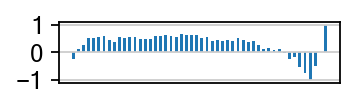

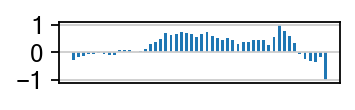

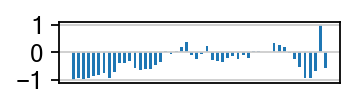

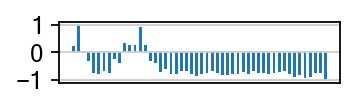

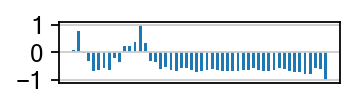

...

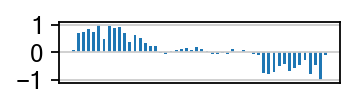

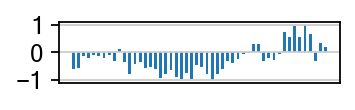

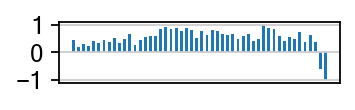

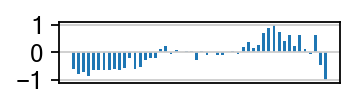

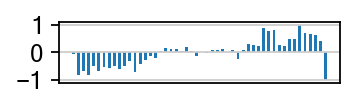

In [61]:
#print the selected m/z
for m in selected_m:
    sc.set_figure_params(fontsize=10.8, color_map='Spectral_r')
    plt.figure(figsize=(2.25, 0.5))
    ax=plt.bar(x=[int(i) for i in data_sec_zscores.index], height=data_sec_scaled[m].values, width=100)
    plt.xticks([]) 
    #plt.xlabel('Sections P-D (knee to ankle)',fontsize=10.8, fontname="Microsoft Sans Serif")
    #plt.ylabel('Z-score M1',fontsize=10.8, fontname="Microsoft Sans Serif")
    plt.rcParams['svg.fonttype'] = 'none'
    plt.rcParams["font.family"] = "Microsoft Sans Serif"
    plt.savefig('M1_'+selected_m[m]+'_barplot.svg', format = 'svg', dpi=300, bbox_inches='tight')  
    plt.show()
    plt.close()

#### Muslce 2

In [62]:
adata_2=adata[adata.obs["Sample"] == "Muscle_2"]

In [63]:
round(abs(sum([adata_2.obs["x"][-1],(adata_2.obs["x"][0])*(-1)]))/50)

149

In [64]:
data_sec=pd.DataFrame(index=df_var_all['mz'].values.tolist())
start=adata_2.obs["x"][0]
for i in np.arange(1,51,1):
    end=start+150
    s1=pd.DataFrame(adata_2[adata_2.obs["x"].isin(list(np.arange(start, end, 1)))].X).sum()/np.shape(adata_2[adata_2.obs["x"].isin(list(np.arange(start, end, 1)))].X)[0]
    data_sec[start]=s1.set_axis(df_var_all['mz'].values.tolist())
    start=end
data_sec=data_sec.sort_index()

#calculate the szcores
data_sec_zscores = zscores(data_sec)
data_sec_scaled = scaledZscores(data_sec_zscores)

data_sec_zscores=data_sec_zscores.T
data_sec_scaled=data_sec_scaled.T


In [65]:
#save source data
data_2=pd.concat([nomenclature, data_sec_scaled.T.loc[selected_m.keys()]],axis=1)

#data_2.loc[list(selected_m.keys())[0:13]].T.to_excel('Muscle2_source_insilico_data_metabolites.xlsx') 
#data_2.loc[list(selected_m.keys())[13:]].T.to_excel('Muscle2_source_insilico_data_lipids.xlsx') 

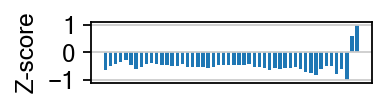

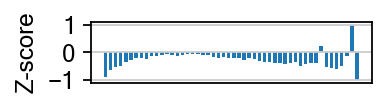

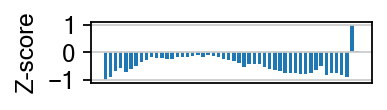

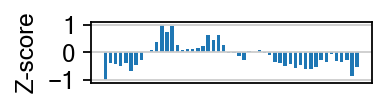

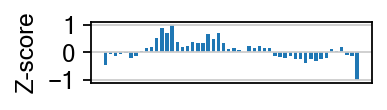

...

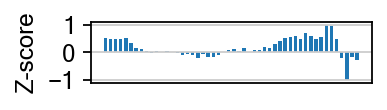

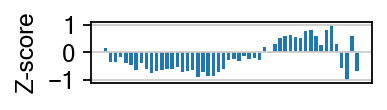

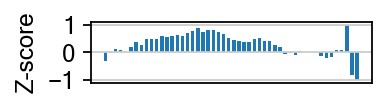

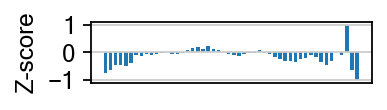

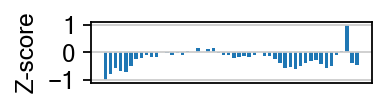

In [66]:
#print the selected m/z
for m in selected_m:
    sc.set_figure_params(fontsize=10.8, color_map='Spectral_r')
    plt.figure(figsize=(2.25, 0.5))
    ax=plt.bar(x=[int(i) for i in data_sec_zscores.index], height=data_sec_scaled[m].values, width=100)
    plt.xticks([]) 
    #plt.xlabel('Sections P-D (knee to ankle)',fontsize=10.8, fontname="Microsoft Sans Serif")
    plt.ylabel('Z-score',fontsize=10.8, fontname="Microsoft Sans Serif")
    plt.rcParams['svg.fonttype'] = 'none'
    plt.rcParams["font.family"] = "Microsoft Sans Serif"
    plt.savefig('M2_'+selected_m[m]+'_barplot.svg', format = 'svg', dpi=300, bbox_inches='tight')  
    plt.show()
    plt.close()

#### Muscle 3

In [67]:
adata_3=adata[adata.obs["Sample"] == "Muscle_3"]

In [68]:
round(abs(sum([adata_3.obs["x"][-1],(adata_3.obs["x"][0])*(-1)]))/50)

142

In [69]:
data_sec=pd.DataFrame(index=df_var_all['mz'].values.tolist())
start=adata_3.obs["x"][0]
for i in np.arange(1,51,1):
    end=start-142
    s1=pd.DataFrame(adata_3[adata_3.obs["x"].isin(list(np.arange(end, start, 1)))].X).sum()/np.shape(adata_3[adata_3.obs["x"].isin(list(np.arange(end, start, 1)))].X)[0]
    data_sec[start]=s1.set_axis(df_var_all['mz'].values.tolist())
    start=end
data_sec=data_sec.sort_index()

#calculate the szcores
data_sec_zscores = zscores(data_sec)
data_sec_scaled = scaledZscores(data_sec_zscores)

data_sec_zscores=data_sec_zscores.T
data_sec_scaled=data_sec_scaled.T


In [70]:
#save source data
data_3=pd.concat([nomenclature, data_sec_scaled.T.loc[selected_m.keys()]],axis=1)

#data_3.loc[list(selected_m.keys())[0:13]].T.to_excel('Muscle3_source_insilico_data_metabolites.xlsx') 
#data_3.loc[list(selected_m.keys())[13:]].T.to_excel('Muscle3_source_insilico_data_lipids.xlsx') 

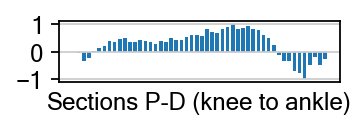

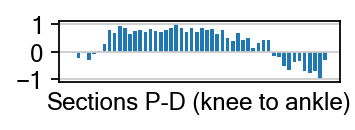

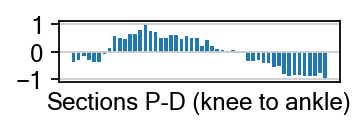

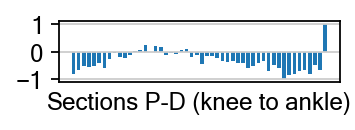

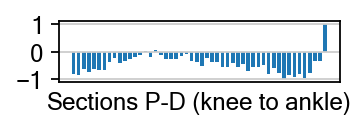

...

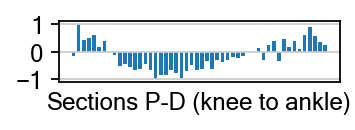

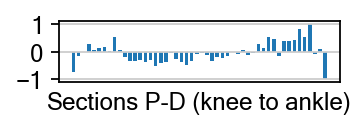

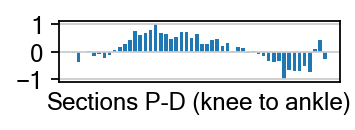

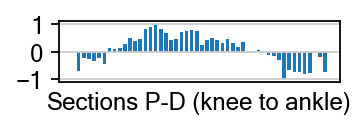

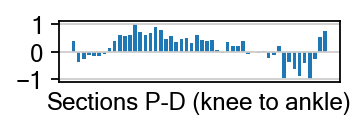

In [71]:
#print the selected m/z
for m in selected_m:
    sc.set_figure_params(fontsize=10.8, color_map='Spectral_r')
    plt.figure(figsize=(2.25, 0.5))
    ax=plt.bar(x=[int(i) for i in data_sec_zscores.index], height=data_sec_scaled[m].values, width=100)
    plt.xticks([]) 
    plt.xlabel('Sections P-D (knee to ankle)',fontsize=10.8, fontname="Microsoft Sans Serif")
    #plt.ylabel('Z-score',fontsize=10.8, fontname="Microsoft Sans Serif")
    plt.rcParams['svg.fonttype'] = 'none'
    plt.rcParams["font.family"] = "Microsoft Sans Serif"
    plt.savefig('M3_'+selected_m[m]+'_barplot.svg', format = 'svg', dpi=300, bbox_inches='tight')  
    plt.show()
    plt.close()